
## Food Demand Forecasting

### Problem statement 

Your client is a meal delivery company which operates in multiple cities. They have various fulfillment centers in these cities for dispatching meal orders to their customers. The client wants you to help these centers with demand forecasting for upcoming weeks so that these centers will plan the stock of raw materials accordingly.

The replenishment of majority of raw materials is done on weekly basis and since the raw material is perishable, the procurement planning is of utmost importance. Secondly, staffing of the centers is also one area wherein accurate demand forecasts are really helpful. Given the following information, the task is to predict the demand for the next 10 weeks (Weeks: 146-155) for the center-meal combinations in the test set:  

    Historical data of demand for a product-center combination (Weeks: 1 to 145)
    Product(Meal) features such as category, sub-category, current price and discount
    Information for fulfillment center like center area, city information etc.


#### Data Dictionary


1) Weekly Demand data (train.csv): Contains the historical demand data for all centers, test.csv contains all the following features except the target variable


![dataset1](data_set_1.JPG)

2) fulfilment_center_info.csv: Contains information for each fulfilment center

![dataset2](data_set_2.JPG)

3) meal_info.csv: Contains information for each meal being served

![title](data_set_3.JPG)

#### Evaluation Metric

The evaluation metric for this competition is 100*RMSLE where RMSLE is Root of Mean Squared Logarithmic Error across all entries in the test set.

#### Public and Private Split

Test data is further randomly divided into Public (30%) and Private (70%) data.

    Your initial responses will be checked and scored on the Public data.
    The final rankings would be based on your private score which will be published once the competition is over.


# Solution 

## Step 1: Reading and Understanding the Data



In [128]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

In [129]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
import seaborn as sns
from xgboost import XGBClassifier
from sklearn import preprocessing
from sklearn.linear_model import RidgeCV

%matplotlib inline

In [130]:
train = pd.read_csv("dataset/train.csv")
fulfilment_center_info = pd.read_csv("dataset/fulfilment_center_info.csv")
meal_info = pd.read_csv("dataset/meal_info.csv")


In [131]:
test = pd.read_csv('dataset/test_QoiMO9B.csv')

In [132]:
train.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders
0,1379560,1,55,1885,136.83,152.29,0,0,177
1,1466964,1,55,1993,136.83,135.83,0,0,270
2,1346989,1,55,2539,134.86,135.86,0,0,189
3,1338232,1,55,2139,339.50,437.53,0,0,54
4,1448490,1,55,2631,243.50,242.50,0,0,40


In [133]:
test.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured
0,1028232,146,55,1885,158.11,159.11,0,0
1,1127204,146,55,1993,160.11,159.11,0,0
2,1212707,146,55,2539,157.14,159.14,0,0
3,1082698,146,55,2631,162.02,162.02,0,0
4,1400926,146,55,1248,163.93,163.93,0,0


In [134]:
fulfilment_center_info.head()

,center_id,city_code,region_code,center_type,op_area
0,11,679,56,TYPE_A,3.7
1,13,590,56,TYPE_B,6.7
2,124,590,56,TYPE_C,4.0
3,66,648,34,TYPE_A,4.1
4,94,632,34,TYPE_C,3.6


In [135]:
meal_info.head()

,meal_id,category,cuisine
0,1885,Beverages,Thai
1,1993,Beverages,Thai
2,2539,Beverages,Thai
3,1248,Beverages,Indian
4,2631,Beverages,Indian


In [136]:
train.shape

(456548, 9)

In [137]:
fulfilment_center_info.shape

(77, 5)

In [138]:
meal_info.shape

(51, 3)

### Merge Data 

In [141]:

## Merge train data 
train = pd.merge(train,fulfilment_center_info, on='center_id')
train = pd.merge(train,meal_info, on='meal_id')

In [142]:
## Merge test data 
test = pd.merge(test,fulfilment_center_info, on='center_id')
test = pd.merge(test,meal_info, on='meal_id')

In [143]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 456548 entries, 0 to 456547
Data columns (total 15 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   id                     456548 non-null  int64  
 1   week                   456548 non-null  int64  
 2   center_id              456548 non-null  int64  
 3   meal_id                456548 non-null  int64  
 4   checkout_price         456548 non-null  float64
 5   base_price             456548 non-null  float64
 6   emailer_for_promotion  456548 non-null  int64  
 7   homepage_featured      456548 non-null  int64  
 8   num_orders             456548 non-null  int64  
 9   city_code              456548 non-null  int64  
 10  region_code            456548 non-null  int64  
 11  center_type            456548 non-null  object 
 12  op_area                456548 non-null  float64
 13  category               456548 non-null  object 
 14  cuisine                456548 non-nu

In [144]:
train.describe()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,city_code,region_code,op_area
count,4.565480e+05,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000,456548.00000,456548.000000,456548.000000,456548.000000,456548.000000
mean,1.250096e+06,74.768771,82.105796,2024.337458,332.238933,354.156627,0.081152,0.10920,261.872760,601.553399,56.614566,4.083590
std,1.443548e+05,41.524956,45.975046,547.420920,152.939723,160.715914,0.273069,0.31189,395.922798,66.195914,17.641306,1.091686
min,1.000000e+06,1.000000,10.000000,1062.000000,2.970000,55.350000,0.000000,0.00000,13.000000,456.000000,23.000000,0.900000
25%,1.124999e+06,39.000000,43.000000,1558.000000,228.950000,243.500000,0.000000,0.00000,54.000000,553.000000,34.000000,3.600000
50%,1.250184e+06,76.000000,76.000000,1993.000000,296.820000,310.460000,0.000000,0.00000,136.000000,596.000000,56.000000,4.000000
75%,1.375140e+06,111.000000,110.000000,2539.000000,445.230000,458.870000,0.000000,0.00000,324.000000,651.000000,77.000000,4.500000
max,1.499999e+06,145.000000,186.000000,2956.000000,866.270000,866.270000,1.000000,1.00000,24299.000000,713.000000,93.000000,7.000000


## Step 2: Feel the data ! 

In [145]:
# Generate the profile report
train_report = ProfileReport(train)

In [146]:
print(repr(train_report.report))


Root


In [147]:
print(train_report.report.content)

{'body': Container(name=Root), 'footer': HTML, 'name': 'Root'}


In [148]:
train_report.to_notebook_iframe()

### visualize the data 

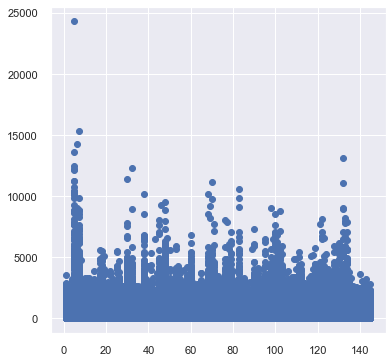

In [153]:
sns.set(font_scale=1)
plt.figure(figsize=[6,6])
plt.scatter(train.week, train.num_orders)
plt.show()

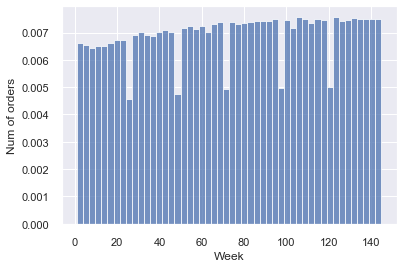

In [154]:
# the histogram of the data
n, bins, patches = plt.hist(train.week,50, density=True,facecolor='b', alpha=0.75)
plt.xlabel('Week')
plt.ylabel('Num of orders')
plt.grid(True)
plt.show()


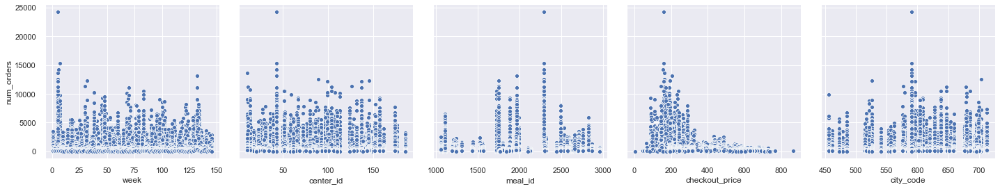

In [155]:
sns.pairplot(train,x_vars=['week','center_id','meal_id','checkout_price', 'city_code'],y_vars='num_orders',size=4,aspect=1,kind='scatter')
plt.show()

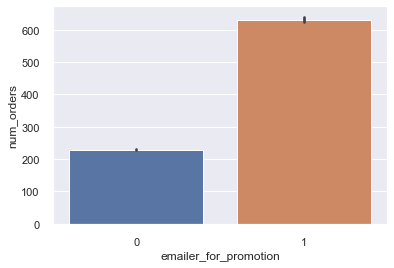

In [156]:
sns.barplot(x='emailer_for_promotion',y='num_orders',data=train)
plt.show()

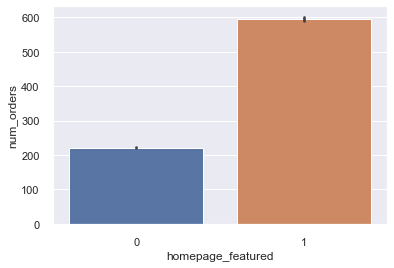

In [157]:
sns.barplot(x='homepage_featured',y='num_orders',data=train)
plt.show()

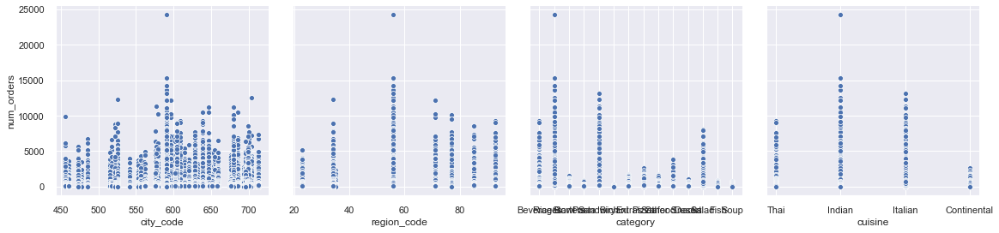

In [158]:
sns.pairplot(train,x_vars=['city_code','region_code','category','cuisine'],y_vars='num_orders',size=4,aspect=1,kind='scatter')
plt.show()

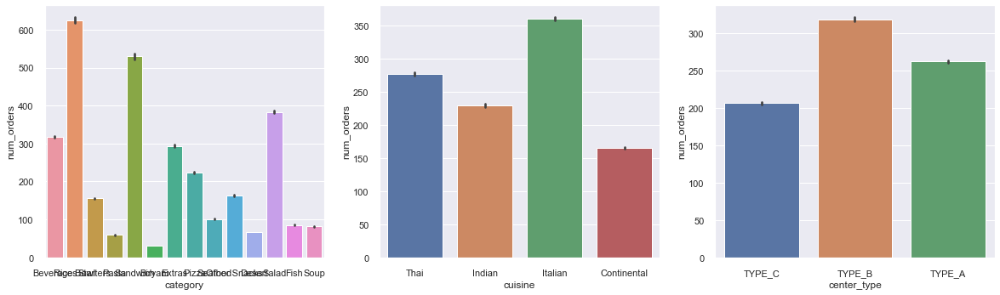

In [159]:
plt.figure(figsize=(20,12))
plt.subplot(2,3,1)
sns.barplot(x='category',y='num_orders',data=train)

plt.subplot(2,3,2)
sns.barplot(x='cuisine',y='num_orders',data=train)

plt.subplot(2,3,3)
sns.barplot(x='center_type',y='num_orders',data=train)


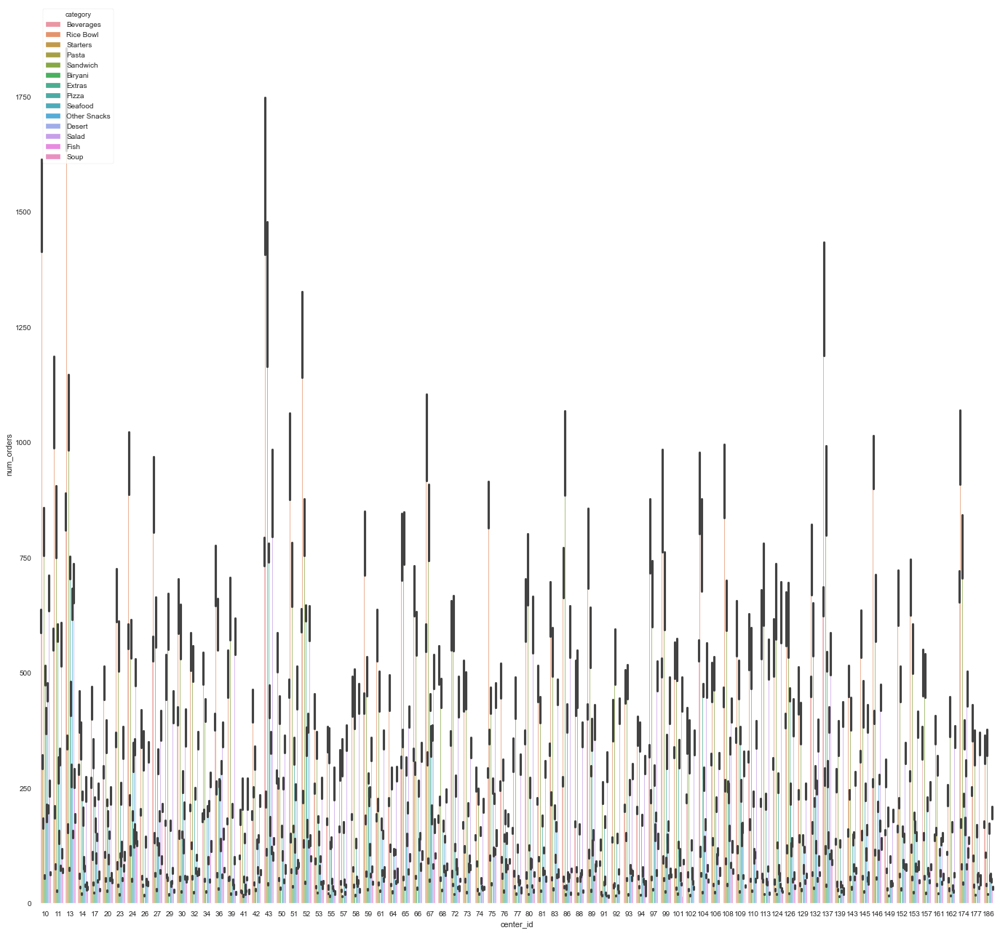

In [99]:
#check the impact of custum variables on price
plt.figure(figsize=(80,50))
plt.subplot(2,3,1)
sns.barplot(x='center_id',y='num_orders',hue='category',data=train)

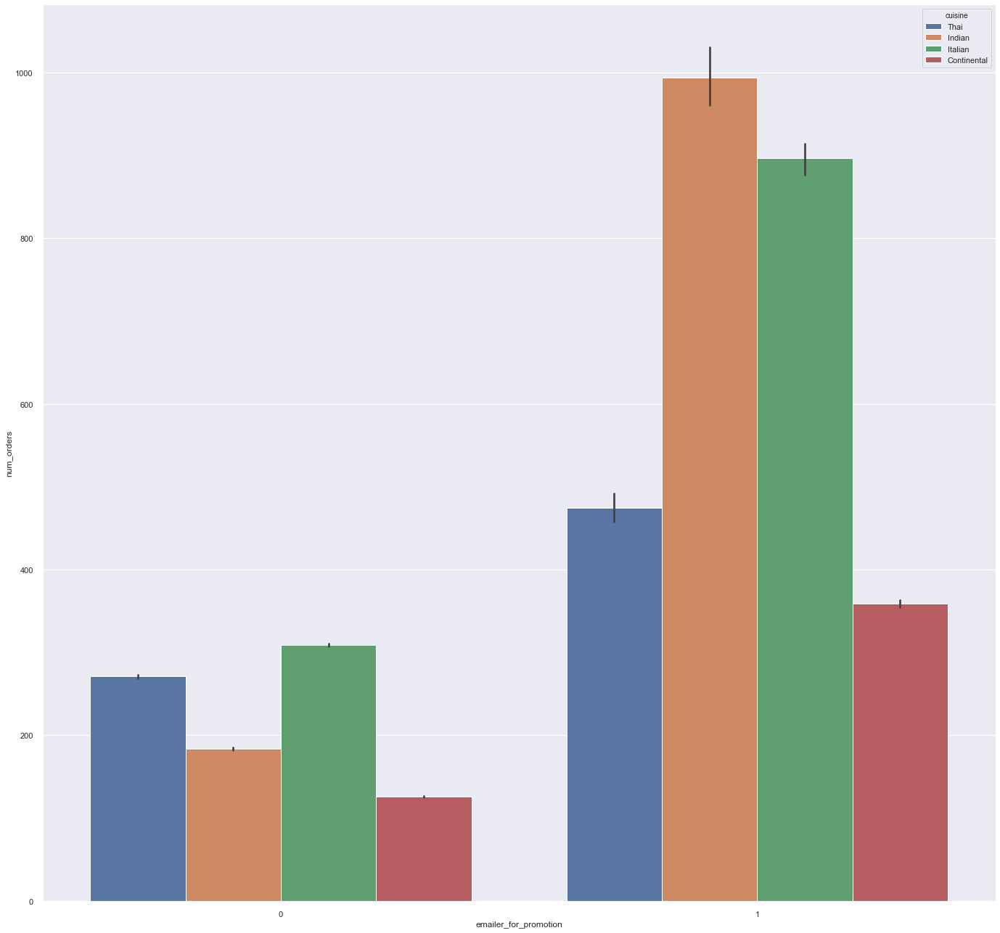

In [160]:
#check the impact of custum variables on price
plt.figure(figsize=(80,50))
plt.subplot(2,3,1)
sns.barplot(x='emailer_for_promotion',y='num_orders',hue='cuisine',data=train)

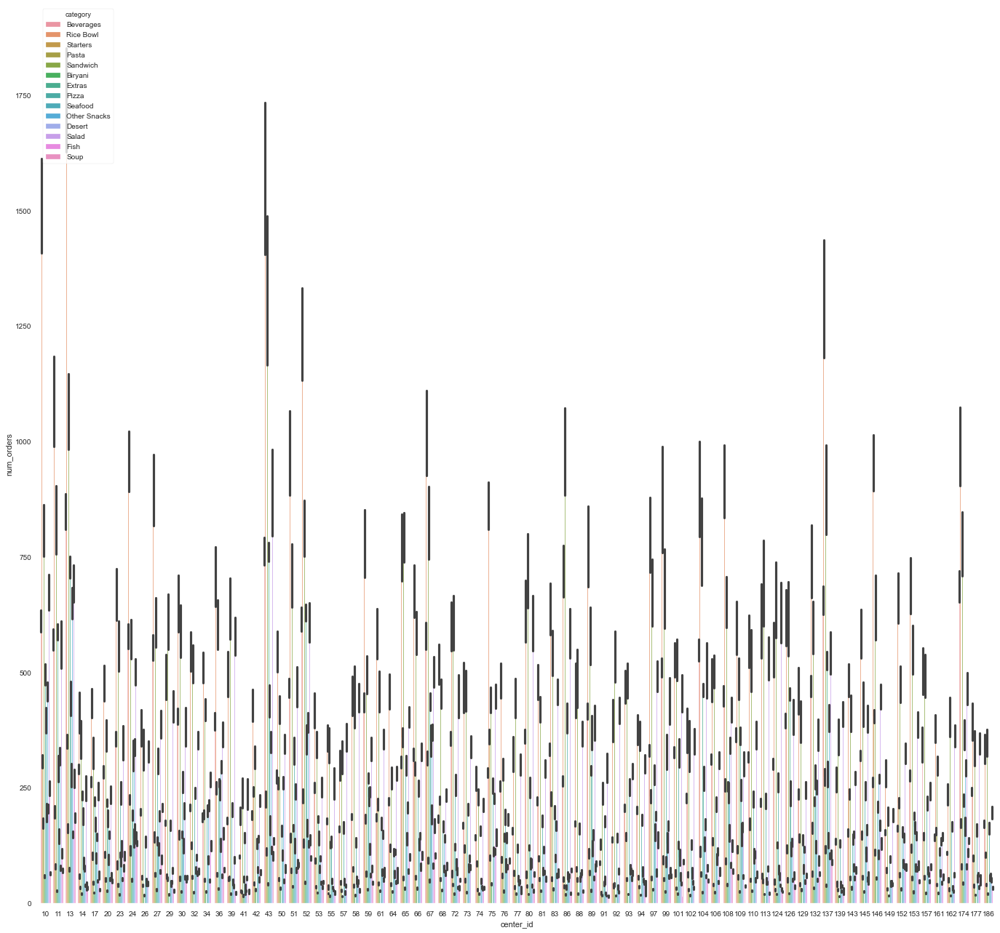

In [30]:
#check the impact of custum variables on price
plt.figure(figsize=(80,50))
plt.subplot(2,3,1)
sns.barplot(x='center_id',y='num_orders',hue='category',data=train)

### Data Preparation

In [161]:
# Check for missing data  
round(100*(train.iloc[:,:50].isnull().sum()/len(train.index)), 2)

id                       0.0
week                     0.0
center_id                0.0
meal_id                  0.0
checkout_price           0.0
base_price               0.0
emailer_for_promotion    0.0
homepage_featured        0.0
num_orders               0.0
city_code                0.0
region_code              0.0
center_type              0.0
op_area                  0.0
category                 0.0
cuisine                  0.0
dtype: float64

In [162]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 456548 entries, 0 to 456547
Data columns (total 15 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   id                     456548 non-null  int64  
 1   week                   456548 non-null  int64  
 2   center_id              456548 non-null  int64  
 3   meal_id                456548 non-null  int64  
 4   checkout_price         456548 non-null  float64
 5   base_price             456548 non-null  float64
 6   emailer_for_promotion  456548 non-null  int64  
 7   homepage_featured      456548 non-null  int64  
 8   num_orders             456548 non-null  int64  
 9   city_code              456548 non-null  int64  
 10  region_code            456548 non-null  int64  
 11  center_type            456548 non-null  object 
 12  op_area                456548 non-null  float64
 13  category               456548 non-null  object 
 14  cuisine                456548 non-nu

### diving into feature engineering!

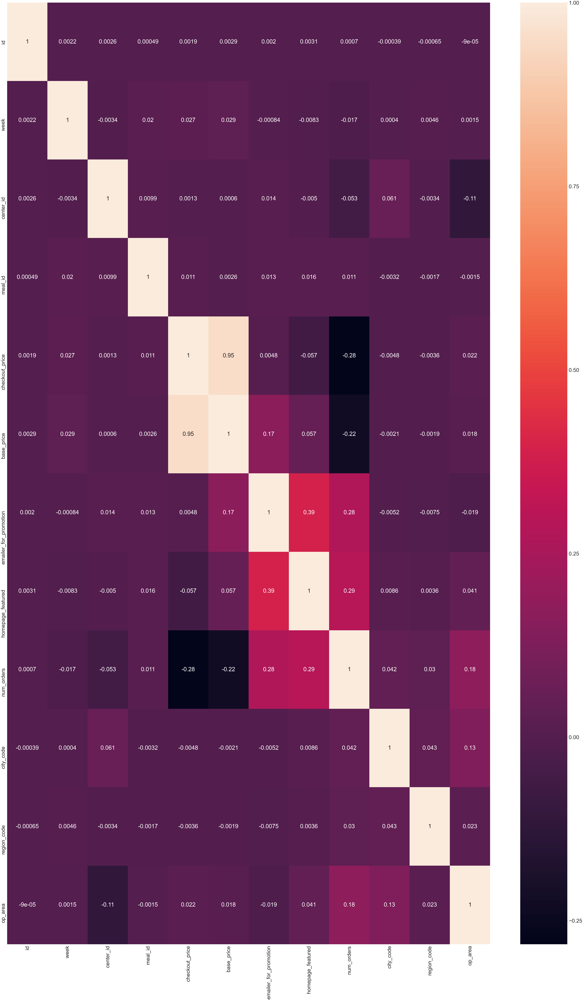

In [163]:
# Let's see the correlation matrix 
plt.figure(figsize=(100, 160))        # Size of the figure
sns.set(font_scale=4.5)
sns.heatmap(train.corr(),annot = True)
sns.set(font_scale=1)

In [164]:
#Drop base_price, since its highly cooreleated with checkout price 
train=train.drop('base_price',axis=1)
# drop from test as well 
test=test.drop('base_price',axis=1)

In [165]:
#Drop Id as it doesnt have any impact on the num_orders
train_id = train['id']
train_id

0         1379560
1         1018704
2         1196273
3         1116527
4         1343872
           ...   
456543    1437396
456544    1060716
456545    1029231
456546    1141147
456547    1443704
Name: id, Length: 456548, dtype: int64

In [167]:
#save test_id for comparison for later 
test_id = test['id']
test_id

0        1028232
1        1262649
2        1453211
3        1262599
4        1495848
          ...   
32568    1412025
32569    1287019
32570    1396176
32571    1331977
32572    1017414
Name: id, Length: 32573, dtype: int64

In [168]:
# since we know that ID wont be impacting the num_orders
train=train.drop('id',axis=1)
# drop from test as well 
test=test.drop('id',axis=1)

In [169]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 456548 entries, 0 to 456547
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   week                   456548 non-null  int64  
 1   center_id              456548 non-null  int64  
 2   meal_id                456548 non-null  int64  
 3   checkout_price         456548 non-null  float64
 4   emailer_for_promotion  456548 non-null  int64  
 5   homepage_featured      456548 non-null  int64  
 6   num_orders             456548 non-null  int64  
 7   city_code              456548 non-null  int64  
 8   region_code            456548 non-null  int64  
 9   center_type            456548 non-null  object 
 10  op_area                456548 non-null  float64
 11  category               456548 non-null  object 
 12  cuisine                456548 non-null  object 
dtypes: float64(2), int64(8), object(3)
memory usage: 68.8+ MB


In [170]:
# We have 3 categorical data - 'category','center_type','cuisine'

In [171]:
non_categorical_features = set(train._get_numeric_data().columns)
non_categorical_features

{'center_id',
 'checkout_price',
 'city_code',
 'emailer_for_promotion',
 'homepage_featured',
 'meal_id',
 'num_orders',
 'op_area',
 'region_code',
 'week'}

In [172]:
categorical_features = set(train.columns) - set(non_categorical_features)
categorical_features

{'category', 'center_type', 'cuisine'}

In [173]:
# add homepage_featured and emailer_for_promotion to catergorical data 
categorical_features.add('homepage_featured')
categorical_features.add('emailer_for_promotion')
categorical_features

{'category',
 'center_type',
 'cuisine',
 'emailer_for_promotion',
 'homepage_featured'}

In [174]:
non_categorical_features.remove('homepage_featured')


In [175]:
non_categorical_features.remove('emailer_for_promotion')
non_categorical_features

{'center_id',
 'checkout_price',
 'city_code',
 'meal_id',
 'num_orders',
 'op_area',
 'region_code',
 'week'}

In [176]:
train.category.unique()

array(['Beverages', 'Rice Bowl', 'Starters', 'Pasta', 'Sandwich',
       'Biryani', 'Extras', 'Pizza', 'Seafood', 'Other Snacks', 'Desert',
       'Salad', 'Fish', 'Soup'], dtype=object)

In [177]:
train.cuisine.unique()

array(['Thai', 'Indian', 'Italian', 'Continental'], dtype=object)

In [178]:
train.center_type.unique()

array(['TYPE_C', 'TYPE_B', 'TYPE_A'], dtype=object)

### Dummy encoding for other catogorical data

In [179]:
categoryStatus = pd.get_dummies(train['category'],drop_first=True)
train=pd.concat([train,categoryStatus ],axis=1)
train.drop(['category'], axis = 1, inplace = True)
train.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,city_code,region_code,center_type,...,Fish,Other Snacks,Pasta,Pizza,Rice Bowl,Salad,Sandwich,Seafood,Soup,Starters
0,1,55,1885,136.83,0,0,177,647,56,TYPE_C,...,0,0,0,0,0,0,0,0,0,0
1,2,55,1885,135.83,0,0,323,647,56,TYPE_C,...,0,0,0,0,0,0,0,0,0,0
2,3,55,1885,132.92,0,0,96,647,56,TYPE_C,...,0,0,0,0,0,0,0,0,0,0
3,4,55,1885,135.86,0,0,163,647,56,TYPE_C,...,0,0,0,0,0,0,0,0,0,0
4,5,55,1885,146.50,0,0,215,647,56,TYPE_C,...,0,0,0,0,0,0,0,0,0,0


In [180]:
cuisineStatus = pd.get_dummies(train['cuisine'],drop_first=True)
train=pd.concat([train,cuisineStatus ],axis=1)
train.drop(['cuisine'], axis = 1, inplace = True)
train.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,city_code,region_code,center_type,...,Pizza,Rice Bowl,Salad,Sandwich,Seafood,Soup,Starters,Indian,Italian,Thai
0,1,55,1885,136.83,0,0,177,647,56,TYPE_C,...,0,0,0,0,0,0,0,0,0,1
1,2,55,1885,135.83,0,0,323,647,56,TYPE_C,...,0,0,0,0,0,0,0,0,0,1
2,3,55,1885,132.92,0,0,96,647,56,TYPE_C,...,0,0,0,0,0,0,0,0,0,1
3,4,55,1885,135.86,0,0,163,647,56,TYPE_C,...,0,0,0,0,0,0,0,0,0,1
4,5,55,1885,146.50,0,0,215,647,56,TYPE_C,...,0,0,0,0,0,0,0,0,0,1


In [181]:
center_typeStatus = pd.get_dummies(train['center_type'],drop_first=True)
train=pd.concat([train,center_typeStatus],axis=1)
train.drop(['center_type'], axis = 1, inplace = True)
train.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,city_code,region_code,op_area,...,Salad,Sandwich,Seafood,Soup,Starters,Indian,Italian,Thai,TYPE_B,TYPE_C
0,1,55,1885,136.83,0,0,177,647,56,2.0,...,0,0,0,0,0,0,0,1,0,1
1,2,55,1885,135.83,0,0,323,647,56,2.0,...,0,0,0,0,0,0,0,1,0,1
2,3,55,1885,132.92,0,0,96,647,56,2.0,...,0,0,0,0,0,0,0,1,0,1
3,4,55,1885,135.86,0,0,163,647,56,2.0,...,0,0,0,0,0,0,0,1,0,1
4,5,55,1885,146.50,0,0,215,647,56,2.0,...,0,0,0,0,0,0,0,1,0,1


In [182]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 456548 entries, 0 to 456547
Data columns (total 28 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   week                   456548 non-null  int64  
 1   center_id              456548 non-null  int64  
 2   meal_id                456548 non-null  int64  
 3   checkout_price         456548 non-null  float64
 4   emailer_for_promotion  456548 non-null  int64  
 5   homepage_featured      456548 non-null  int64  
 6   num_orders             456548 non-null  int64  
 7   city_code              456548 non-null  int64  
 8   region_code            456548 non-null  int64  
 9   op_area                456548 non-null  float64
 10  Biryani                456548 non-null  uint8  
 11  Desert                 456548 non-null  uint8  
 12  Extras                 456548 non-null  uint8  
 13  Fish                   456548 non-null  uint8  
 14  Other Snacks           456548 non-nu

In [183]:
train.describe()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,city_code,region_code,op_area,...,Salad,Sandwich,Seafood,Soup,Starters,Indian,Italian,Thai,TYPE_B,TYPE_C
count,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000,456548.00000,456548.000000,456548.000000,456548.000000,456548.000000,...,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000
mean,74.768771,82.105796,2024.337458,332.238933,0.081152,0.10920,261.872760,601.553399,56.614566,4.083590,...,0.062554,0.072919,0.058955,0.027763,0.065581,0.246660,0.269249,0.258934,0.206055,0.218144
std,41.524956,45.975046,547.420920,152.939723,0.273069,0.31189,395.922798,66.195914,17.641306,1.091686,...,0.242160,0.260004,0.235542,0.164292,0.247549,0.431067,0.443570,0.438050,0.404471,0.412986
min,1.000000,10.000000,1062.000000,2.970000,0.000000,0.00000,13.000000,456.000000,23.000000,0.900000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,39.000000,43.000000,1558.000000,228.950000,0.000000,0.00000,54.000000,553.000000,34.000000,3.600000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,76.000000,76.000000,1993.000000,296.820000,0.000000,0.00000,136.000000,596.000000,56.000000,4.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,111.000000,110.000000,2539.000000,445.230000,0.000000,0.00000,324.000000,651.000000,77.000000,4.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
max,145.000000,186.000000,2956.000000,866.270000,1.000000,1.00000,24299.000000,713.000000,93.000000,7.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [184]:
test.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,city_code,region_code,center_type,op_area,category,cuisine
0,146,55,1885,158.11,0,0,647,56,TYPE_C,2.0,Beverages,Thai
1,147,55,1885,159.11,0,0,647,56,TYPE_C,2.0,Beverages,Thai
2,149,55,1885,157.14,0,0,647,56,TYPE_C,2.0,Beverages,Thai
3,150,55,1885,159.14,0,0,647,56,TYPE_C,2.0,Beverages,Thai
4,151,55,1885,160.11,0,0,647,56,TYPE_C,2.0,Beverages,Thai


In [185]:
categoryStatus = pd.get_dummies(test['category'],drop_first=True)
test=pd.concat([test,categoryStatus ],axis=1)
test.drop(['category'], axis = 1, inplace = True)

cuisineStatus = pd.get_dummies(test['cuisine'],drop_first=True)
test=pd.concat([test,cuisineStatus ],axis=1)
test.drop(['cuisine'], axis = 1, inplace = True)

center_typeStatus = pd.get_dummies(test['center_type'],drop_first=True)
test=pd.concat([test,center_typeStatus],axis=1)
test.drop(['center_type'], axis = 1, inplace = True)
test.head()


,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,city_code,region_code,op_area,Biryani,...,Salad,Sandwich,Seafood,Soup,Starters,Indian,Italian,Thai,TYPE_B,TYPE_C
0,146,55,1885,158.11,0,0,647,56,2.0,0,...,0,0,0,0,0,0,0,1,0,1
1,147,55,1885,159.11,0,0,647,56,2.0,0,...,0,0,0,0,0,0,0,1,0,1
2,149,55,1885,157.14,0,0,647,56,2.0,0,...,0,0,0,0,0,0,0,1,0,1
3,150,55,1885,159.14,0,0,647,56,2.0,0,...,0,0,0,0,0,0,0,1,0,1
4,151,55,1885,160.11,0,0,647,56,2.0,0,...,0,0,0,0,0,0,0,1,0,1


In [186]:
# Let's see the correlation matrix 
plt.figure(figsize=(100, 160))        # Size of the figure
sns.set(font_scale=4.5)
sns.heatmap(train.corr(),annot = True)

In [187]:
# Checking outliers at 25%,50%,75%,90%,95% and 99%
print(train.describe(percentiles=[.25,.5,.75,.90,.95,.99]))
train.describe(percentiles=[.25,.5,.75,.90,.95,.99])

                week      center_id        meal_id  checkout_price  \
count  456548.000000  456548.000000  456548.000000   456548.000000   
mean       74.768771      82.105796    2024.337458      332.238933   
std        41.524956      45.975046     547.420920      152.939723   
min         1.000000      10.000000    1062.000000        2.970000   
25%        39.000000      43.000000    1558.000000      228.950000   
50%        76.000000      76.000000    1993.000000      296.820000   
75%       111.000000     110.000000    2539.000000      445.230000   
90%       132.000000     152.000000    2704.000000      581.030000   
95%       139.000000     161.000000    2760.000000      640.230000   
99%       144.000000     186.000000    2867.000000      708.130000   
max       145.000000     186.000000    2956.000000      866.270000   

       emailer_for_promotion  homepage_featured     num_orders      city_code  \
count          456548.000000       456548.00000  456548.000000  456548.000000 

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,city_code,region_code,op_area,...,Salad,Sandwich,Seafood,Soup,Starters,Indian,Italian,Thai,TYPE_B,TYPE_C
count,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000,456548.00000,456548.000000,456548.000000,456548.000000,456548.000000,...,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000,456548.000000
mean,74.768771,82.105796,2024.337458,332.238933,0.081152,0.10920,261.872760,601.553399,56.614566,4.083590,...,0.062554,0.072919,0.058955,0.027763,0.065581,0.246660,0.269249,0.258934,0.206055,0.218144
std,41.524956,45.975046,547.420920,152.939723,0.273069,0.31189,395.922798,66.195914,17.641306,1.091686,...,0.242160,0.260004,0.235542,0.164292,0.247549,0.431067,0.443570,0.438050,0.404471,0.412986
min,1.000000,10.000000,1062.000000,2.970000,0.000000,0.00000,13.000000,456.000000,23.000000,0.900000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,39.000000,43.000000,1558.000000,228.950000,0.000000,0.00000,54.000000,553.000000,34.000000,3.600000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,76.000000,76.000000,1993.000000,296.820000,0.000000,0.00000,136.000000,596.000000,56.000000,4.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,111.000000,110.000000,2539.000000,445.230000,0.000000,0.00000,324.000000,651.000000,77.000000,4.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
90%,132.000000,152.000000,2704.000000,581.030000,0.000000,1.00000,609.000000,695.000000,77.000000,5.300000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
95%,139.000000,161.000000,2760.000000,640.230000,1.000000,1.00000,878.000000,700.000000,85.000000,6.700000,...,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
99%,144.000000,186.000000,2867.000000,708.130000,1.000000,1.00000,1796.000000,713.000000,93.000000,7.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [188]:
## Remove outliers
outliers_id = train[(train['num_orders']>15000)].index
train.drop(outliers_id,inplace = True)


In [189]:
non_categorical_features

{'center_id',
 'checkout_price',
 'city_code',
 'meal_id',
 'num_orders',
 'op_area',
 'region_code',
 'week'}

In [190]:
#update categorical data
categorical_features = set(train.columns)-set(non_categorical_features) 
categorical_features

{'Biryani',
 'Desert',
 'Extras',
 'Fish',
 'Indian',
 'Italian',
 'Other Snacks',
 'Pasta',
 'Pizza',
 'Rice Bowl',
 'Salad',
 'Sandwich',
 'Seafood',
 'Soup',
 'Starters',
 'TYPE_B',
 'TYPE_C',
 'Thai',
 'emailer_for_promotion',
 'homepage_featured'}

### Linear Regression Model 

In [191]:
# split data into X and y
y_train = train['num_orders']
X_train = train.drop('num_orders',axis=1)


### Linear Regression Model with all variables 

In [192]:
features=X_train.columns
features

Index(['week', 'center_id', 'meal_id', 'checkout_price',
       'emailer_for_promotion', 'homepage_featured', 'city_code',
       'region_code', 'op_area', 'Biryani', 'Desert', 'Extras', 'Fish',
       'Other Snacks', 'Pasta', 'Pizza', 'Rice Bowl', 'Salad', 'Sandwich',
       'Seafood', 'Soup', 'Starters', 'Indian', 'Italian', 'Thai', 'TYPE_B',
       'TYPE_C'],
      dtype='object')

In [193]:
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train)

lr_1 = sm.OLS(y_train, X_train_lm).fit()

lr_1.params

const                    -39.888678
week                      -0.113399
center_id                 -0.377249
meal_id                    0.011265
checkout_price            -0.534216
emailer_for_promotion    265.495246
homepage_featured        242.600003
city_code                  0.145453
region_code                0.653779
op_area                   65.454143
Biryani                  107.498449
Desert                   104.764592
Extras                  -199.044489
Fish                      29.662982
Other Snacks            -315.524415
Pasta                   -295.282218
Pizza                     78.679950
Rice Bowl                607.433412
Salad                     -0.822535
Sandwich                 121.294053
Seafood                    2.751551
Soup                    -408.511633
Starters                -297.087508
Indian                  -181.486613
Italian                  174.195449
Thai                     232.023991
TYPE_B                    13.267214
TYPE_C                   -24

In [194]:
lr_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             num_orders   R-squared:                       0.414
Model:                            OLS   Adj. R-squared:                  0.414
Method:                 Least Squares   F-statistic:                 1.195e+04
Date:                Sat, 13 Jun 2020   Prob (F-statistic):               0.00
Time:                        22:10:14   Log-Likelihood:            -3.2539e+06
No. Observations:              456546   AIC:                         6.508e+06
Df Residuals:                  456518   BIC:                         6.508e+06
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                   -39.8887      5.819     -6.855      0.000     -51.294     -28.484
week                     -0.1134      0.011    -10.467      0.000      -0.135      -0.092
center_id                -0.3772      0.010    -38.002      0.000      -0.397      -0.358
meal_id                   0.0113      0.001     11.833      0.000       0.009       0.013
checkout_price           -0.5342      0.008    -63.738      0.000      -0.551      -0.518
emailer_for_promotion   265.4952      1.966    135.035      0.000     261.642     269.349
homepage_featured       242.6000      1.597    151.919      0.000     239.470     245.730
city_code                 0.1455      0.007     21.011      0.000       0.132       0.159
region_code               0.6538      0.025     25.743      0.000       0.604       0.704
op_area                  65.4541      0.478    136.894      0.000      64.517      66.391
Biryani                 107.4984      3.482     30.875      0.000     100.674     114.322
Desert                  104.7646      3.235     32.388      0.000      98.425     111.104
Extras                 -199.0445      3.190    -62.404      0.000    -205.296    -192.793
Fish                     29.6630      3.950      7.511      0.000      21.922      37.404
Other Snacks           -315.5244      2.663   -118.503      0.000    -320.743    -310.306
Pasta                  -295.2822      3.064    -96.384      0.000    -301.287    -289.278
Pizza                    78.6800      3.222     24.421      0.000      72.365      84.995
Rice Bowl               607.4334      2.660    228.341      0.000     602.220     612.647
Salad                    -0.8225      2.688     -0.306      0.760      -6.091       4.446
Sandwich                121.2941      2.549     47.576      0.000     116.297     126.291
Seafood                   2.7516      3.417      0.805      0.421      -3.946       9.449
Soup                   -408.5116      3.272   -124.861      0.000    -414.924    -402.099
Starters               -297.0875      2.736   -108.567      0.000    -302.451    -291.724
Indian                 -181.4866      2.800    -64.808      0.000    -186.975    -175.998
Italian                 174.1954      2.760     63.117      0.000     168.786     179.605
Thai                    232.0240      3.071     75.565      0.000     226.006     238.042
TYPE_B                   13.2672      1.201     11.043      0.000      10.912      15.622
TYPE_C                  -24.6151      1.215    -20.264      0.000     -26.996     -22.234
==============================================================================
Omnibus:                   638882.822   Durbin-Watson:                   0.830
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        479400907.322
Skew:                           7.885   Prob(JB):       

In [195]:
y_train_num_orders = lr_1.predict(X_train_lm)


In [196]:
X_train_lm.shape

(456546, 28)

In [197]:
y_train_num_orders

0         356.424196
1         356.845013
2         358.286181
3         356.602188
4         350.804733
             ...    
456543    319.294833
456544     77.649862
456545     76.468031
456546     76.888847
456547     77.309664
Length: 456546, dtype: float64

In [198]:
X_test_l = sm.add_constant(test)
y_pred = lr_1.predict(X_test_l)

In [199]:
y_pred

0        328.613187
1        327.965571
2        328.791178
3        327.609347
4        326.977759
            ...    
32568     76.127833
32569    319.148653
32570     50.946603
32571     50.833203
32572     50.072189
Length: 32573, dtype: float64

In [200]:
y_pred[y_pred < 0] = 0

In [201]:
test['id']=test_id
test

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,city_code,region_code,op_area,Biryani,...,Sandwich,Seafood,Soup,Starters,Indian,Italian,Thai,TYPE_B,TYPE_C,id
0,146,55,1885,158.11,0,0,647,56,2.0,0,...,0,0,0,0,0,0,1,0,1,1028232
1,147,55,1885,159.11,0,0,647,56,2.0,0,...,0,0,0,0,0,0,1,0,1,1262649
2,149,55,1885,157.14,0,0,647,56,2.0,0,...,0,0,0,0,0,0,1,0,1,1453211
3,150,55,1885,159.14,0,0,647,56,2.0,0,...,0,0,0,0,0,0,1,0,1,1262599
4,151,55,1885,160.11,0,0,647,56,2.0,0,...,0,0,0,0,0,0,1,0,1,1495848
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32568,146,61,2104,583.03,0,0,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1412025
32569,147,61,2104,582.03,0,1,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1287019
32570,149,61,2104,629.53,0,0,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1396176
32571,150,61,2104,629.53,0,0,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1331977


In [204]:
submission = pd.DataFrame({'id':test['id'],'num_orders':y_pred})
submission = submission[['id','num_orders']]
submission.head()

,id,num_orders
0,1028232,328.613187
1,1262649,327.965571
2,1453211,328.791178
3,1262599,327.609347
4,1495848,326.977759


In [206]:
submission.to_csv('lr1.csv', index=False)

### This gives RMSE value of ~168

## Cross validation Model


In [207]:
# drop from test as well 
test_id = test['id']

test=test.drop('id',axis=1)

In [208]:
regressor = RidgeCV(alphas=[1, 1e3, 1e6], store_cv_values=True)

In [209]:
regressor.fit(X_train, y_train)

RidgeCV(alphas=array([1.e+00, 1.e+03, 1.e+06]), store_cv_values=True)

In [210]:
cv_mse = np.mean(regressor.cv_values_, axis=0)
print(regressor.alpha_)
print(cv_mse)

1.0
[ 90822.12311298  91059.81590109 135206.95846065]


In [211]:
y_pred = regressor.predict(test)

In [212]:
y_pred[y_pred < 0] = 0

In [213]:
test['id']=test_id
test

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,city_code,region_code,op_area,Biryani,...,Sandwich,Seafood,Soup,Starters,Indian,Italian,Thai,TYPE_B,TYPE_C,id
0,146,55,1885,158.11,0,0,647,56,2.0,0,...,0,0,0,0,0,0,1,0,1,1028232
1,147,55,1885,159.11,0,0,647,56,2.0,0,...,0,0,0,0,0,0,1,0,1,1262649
2,149,55,1885,157.14,0,0,647,56,2.0,0,...,0,0,0,0,0,0,1,0,1,1453211
3,150,55,1885,159.14,0,0,647,56,2.0,0,...,0,0,0,0,0,0,1,0,1,1262599
4,151,55,1885,160.11,0,0,647,56,2.0,0,...,0,0,0,0,0,0,1,0,1,1495848
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32568,146,61,2104,583.03,0,0,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1412025
32569,147,61,2104,582.03,0,1,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1287019
32570,149,61,2104,629.53,0,0,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1396176
32571,150,61,2104,629.53,0,0,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1331977


In [214]:
submission_2 = pd.DataFrame({'id':test['id'],'num_orders':y_pred})
submission_2 = submission_2[['id','num_orders']]
submission_2.head()

,id,num_orders
0,1028232,328.570874
1,1262649,327.923161
2,1453211,328.748967
3,1262599,327.566938
4,1495848,326.935255


In [215]:
submission_2.to_csv('Kfold_1.csv', index=False)

### This also gives RMSE value of ~168


### XGBoosting !

In [216]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error

In [217]:
# drop from test as well 
test=test.drop('id',axis=1)

In [218]:
data_dmatrix = xgb.DMatrix(data=X_train,label=y_train)

In [219]:
xg_reg = xgb.XGBRegressor(
            objective ='reg:squarederror', 
            colsample_bytree = 0.3, 
            learning_rate = 0.1,
            max_depth = 5, 
            alpha = 10, 
            n_estimators = 10)

In [220]:
xg_reg.fit(X_train,y_train)



XGBRegressor(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.3, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=10, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=10, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [221]:
pred_y = xg_reg.predict(test)

In [222]:
test['id']=test_id
test

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,city_code,region_code,op_area,Biryani,...,Sandwich,Seafood,Soup,Starters,Indian,Italian,Thai,TYPE_B,TYPE_C,id
0,146,55,1885,158.11,0,0,647,56,2.0,0,...,0,0,0,0,0,0,1,0,1,1028232
1,147,55,1885,159.11,0,0,647,56,2.0,0,...,0,0,0,0,0,0,1,0,1,1262649
2,149,55,1885,157.14,0,0,647,56,2.0,0,...,0,0,0,0,0,0,1,0,1,1453211
3,150,55,1885,159.14,0,0,647,56,2.0,0,...,0,0,0,0,0,0,1,0,1,1262599
4,151,55,1885,160.11,0,0,647,56,2.0,0,...,0,0,0,0,0,0,1,0,1,1495848
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32568,146,61,2104,583.03,0,0,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1412025
32569,147,61,2104,582.03,0,1,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1287019
32570,149,61,2104,629.53,0,0,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1396176
32571,150,61,2104,629.53,0,0,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1331977


In [223]:
submission_3 = pd.DataFrame({'id':test['id'],'num_orders':pred_y})
submission_3 = submission_3[['id','num_orders']]
submission_3.head()

,id,num_orders
0,1028232,148.368118
1,1262649,148.368118
2,1453211,148.368118
3,1262599,148.368118
4,1495848,148.368118


In [224]:
submission_3.to_csv('XG_Boost.csv', index=False)

### This gives RMSE value of ~80

### XGBoosting with k-fold Cross Validation!

In [256]:
# drop from test as well 
test=test.drop('id',axis=1)

In [231]:
data_dmatrix = xgb.DMatrix(data=X_train,label=y_train)

In [232]:
params = {"objective":"reg:squarederror",
          'colsample_bytree': 0.3,
          'learning_rate': 0.1,
          'max_depth': 5, 
          'alpha': 10}

In [233]:
cv_results = xgb.cv(dtrain=data_dmatrix, 
                    params=params, 
                    nfold=5,
                    num_boost_round=50,
                    early_stopping_rounds=10,
                    metrics="rmse", 
                    as_pandas=True, 
                    seed=101)

In [234]:
cv_results.head()

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,446.392773,0.630695,446.446979,2.574899
1,428.627258,2.393561,428.646320,4.021715
2,413.871399,2.289677,413.937610,5.334147
3,397.994190,3.168586,398.189209,5.443534
4,383.663110,2.518016,383.725854,5.475459


In [235]:
#Extract and print the final boosting round metric.
print((cv_results["test-rmse-mean"]).tail(1))

49    231.3582
Name: test-rmse-mean, dtype: float64


In [236]:
xg_reg = xgb.train(params=params, dtrain=data_dmatrix, num_boost_round=10)

In [243]:
### Visualize Boosting Trees and Feature Importance

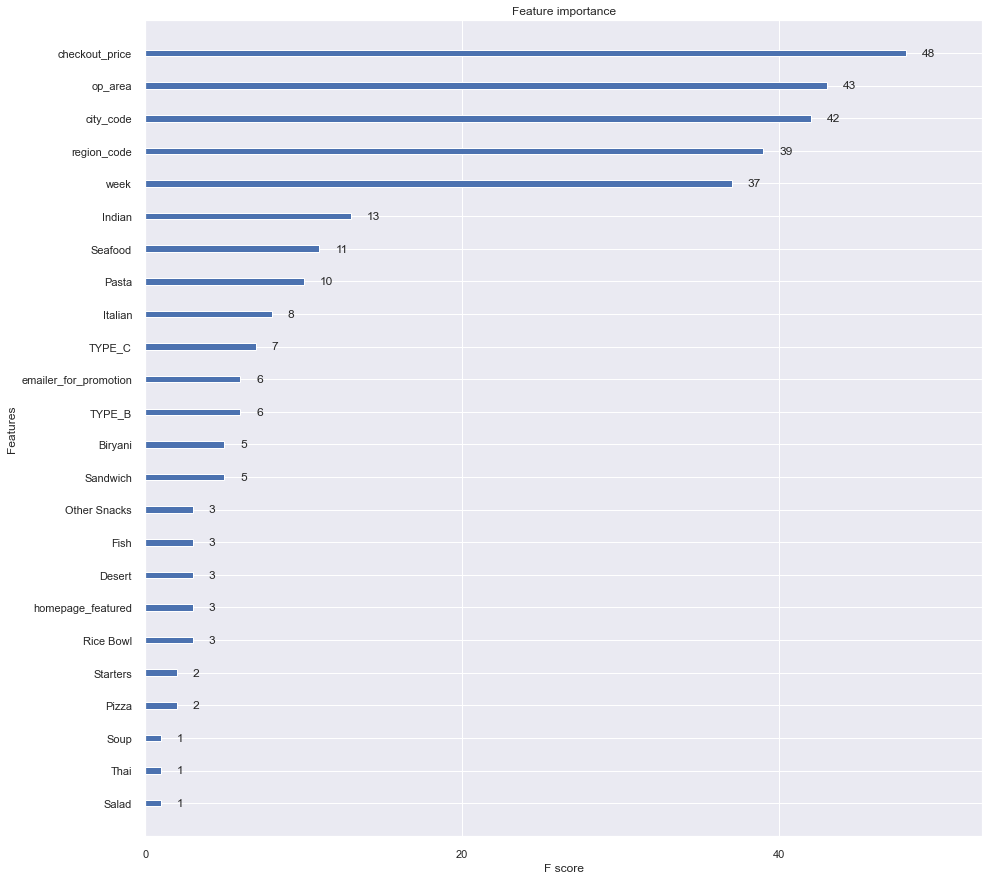

In [246]:
xgb.plot_importance(xg_reg)
plt.rcParams['figure.figsize'] = [15, 15]
sns.set(font_scale=5)
plt.show()

In [248]:
#Drop base_price, since its highly cooreleated with checkout price 
train=train.drop('Salad',axis=1)
# drop from test as well 
test=test.drop('Salad',axis=1)
#Drop base_price, since its highly cooreleated with checkout price 
train=train.drop('Thai',axis=1)
# drop from test as well 
test=test.drop('Thai',axis=1)
#Drop base_price, since its highly cooreleated with checkout price 
train=train.drop('Soup',axis=1)
# drop from test as well 
test=test.drop('Soup',axis=1)

KeyError: "['Salad'] not found in axis"

In [249]:
# drop from test as well 
test=test.drop('Soup',axis=1)

In [250]:
# split data into X and y
y_train = train['num_orders']
X_train = train.drop('num_orders',axis=1)

In [251]:
data_dmatrix = xgb.DMatrix(data=X_train,label=y_train)

In [252]:
xg_reg = xgb.XGBRegressor(
            objective ='reg:squarederror', 
            colsample_bytree = 0.3, 
            learning_rate = 0.1,
            max_depth = 5, 
            alpha = 10, 
            n_estimators = 10)

In [253]:
xg_reg.fit(X_train,y_train)


XGBRegressor(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.3, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=10, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=10, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [257]:
pred_y = xg_reg.predict(test)

In [258]:
test['id']=test_id
test

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,city_code,region_code,op_area,Biryani,...,Pizza,Rice Bowl,Sandwich,Seafood,Starters,Indian,Italian,TYPE_B,TYPE_C,id
0,146,55,1885,158.11,0,0,647,56,2.0,0,...,0,0,0,0,0,0,0,0,1,1028232
1,147,55,1885,159.11,0,0,647,56,2.0,0,...,0,0,0,0,0,0,0,0,1,1262649
2,149,55,1885,157.14,0,0,647,56,2.0,0,...,0,0,0,0,0,0,0,0,1,1453211
3,150,55,1885,159.14,0,0,647,56,2.0,0,...,0,0,0,0,0,0,0,0,1,1262599
4,151,55,1885,160.11,0,0,647,56,2.0,0,...,0,0,0,0,0,0,0,0,1,1495848
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32568,146,61,2104,583.03,0,0,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1412025
32569,147,61,2104,582.03,0,1,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1287019
32570,149,61,2104,629.53,0,0,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1396176
32571,150,61,2104,629.53,0,0,473,77,4.5,0,...,0,0,0,0,0,0,0,0,0,1331977


In [261]:
submission_4 = pd.DataFrame({'id':test['id'],'num_orders':pred_y})
submission_4 = submission_4[['id','num_orders']]
submission_4.head()

,id,num_orders
0,1028232,172.218887
1,1262649,172.218887
2,1453211,172.218887
3,1262599,172.218887
4,1495848,172.218887


In [262]:
submission_4.to_csv('XG_Boost_2.csv', index=False)

In [263]:
### This gives RMSE value of ~91